# Exploratory data analysis of modern Olympic Games:

In [1]:
import zipfile

import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec 
import seaborn as sns
from ridgeplot import ridgeplot

import warnings
warnings.filterwarnings("ignore")

In [2]:
zipped_data = 'data.zip'
with zipfile.ZipFile(zipped_data) as z:
   with z.open('data/athlete_events.csv') as f:
      my_data = pd.read_csv(f)

In [3]:
my_data.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [4]:
my_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271116 entries, 0 to 271115
Data columns (total 15 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   ID      271116 non-null  int64  
 1   Name    271116 non-null  object 
 2   Sex     271116 non-null  object 
 3   Age     261642 non-null  float64
 4   Height  210945 non-null  float64
 5   Weight  208241 non-null  float64
 6   Team    271116 non-null  object 
 7   NOC     271116 non-null  object 
 8   Games   271116 non-null  object 
 9   Year    271116 non-null  int64  
 10  Season  271116 non-null  object 
 11  City    271116 non-null  object 
 12  Sport   271116 non-null  object 
 13  Event   271116 non-null  object 
 14  Medal   39783 non-null   object 
dtypes: float64(3), int64(2), object(10)
memory usage: 31.0+ MB


In [5]:
#We can get rid of certain unuseful fields such as id and Games:
my_data.drop(["ID","Games"], axis = 1, inplace = True)

## 1. Evolution of competitions over the years: number of competitions per Olympic Game

In [6]:
#Extract and filter data:
#Since the dataset englobe the summer and winter season we create two separetes daframes for forther filtering operations:
jjoo_summer = my_data[my_data['Season'] == 'Summer']
jjoo_winter = my_data[my_data['Season'] == 'Winter']

#From each set we count the the number of unique sport events within each year:
sports_summer = {year: len(df_year.Sport.unique()) for year, df_year in jjoo_summer.groupby('Year')}
sports_winter = {year: len(df_year.Sport.unique()) for year, df_year in jjoo_winter.groupby('Year')}

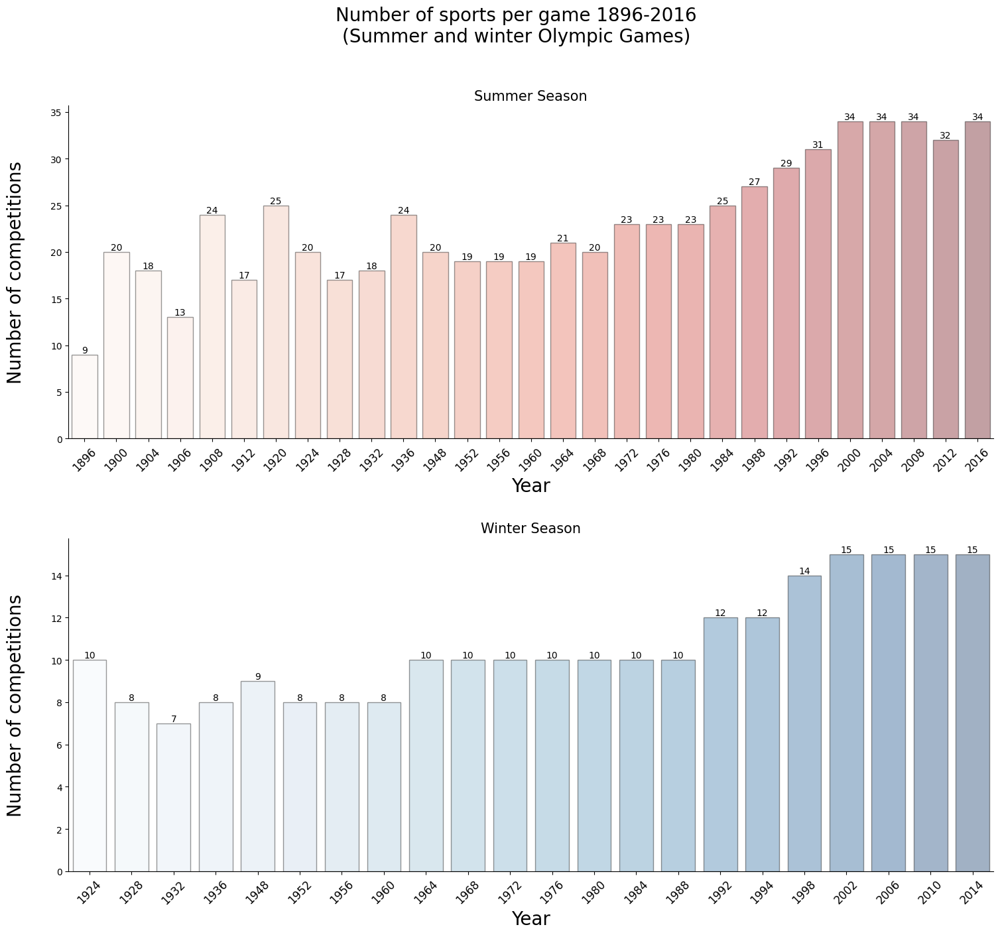

In [7]:
fig, ax = plt.subplots(2, figsize = (18, 15))
plt.subplots_adjust(hspace = .3)
sns.despine(right=True)

def barplot_per_season (data, axis, color_palette, season):
    sns.barplot(x = list(data.keys()) , y = list(data.values()), ax = axis, palette = color_palette ,alpha = .4,edgecolor = 'k')
    axis.set_xticklabels(list(data.keys()), size = 12 , rotation=45)
    axis.set_xlabel("Year",fontsize=20)
    axis.set_ylabel("Number of competitions\n",fontsize=20)
    axis.set_title(f'\n{season} Season', size = 15)
    for i in axis.containers:
        axis.bar_label(i,)    
        
barplot_per_season (sports_summer, ax[0], 'Reds', 'Summer')
barplot_per_season (sports_winter, ax[1], 'Blues', 'Winter')

fig.suptitle('Number of sports per game 1896-2016\n(Summer and winter Olympic Games)',size = 20)
plt.show()

## 2. Evolution of women and men partitipation over the years in the olympic games, summer season

In [8]:
no_duplicates = {Year: dataframe.drop_duplicates(subset=['Name']) for Year, dataframe in jjoo_summer.groupby('Year')}
evol = pd.concat(no_duplicates.values()).reset_index(drop = True)

In [9]:
evol.head()

,Name,Sex,Age,Height,Weight,Team,NOC,Year,Season,City,Sport,Event,Medal
0,Aristidis Akratopoulos,M,NaN,NaN,NaN,Greece,GRE,1896,Summer,Athina,Tennis,Tennis Men's Singles,NaN
1,"Konstantinos ""Kostas"" Akratopoulos",M,NaN,NaN,NaN,Greece,GRE,1896,Summer,Athina,Tennis,Tennis Men's Singles,NaN
2,Anastasios Andreou,M,NaN,NaN,NaN,Greece,GRE,1896,Summer,Athina,Athletics,Athletics Men's 110 metres Hurdles,NaN
3,Ioannis Andreou,M,NaN,NaN,NaN,Greece,GRE,1896,Summer,Athina,Swimming,"Swimming Men's 1,200 metres Freestyle",Silver
4,Nikolaos Andriakopoulos,M,NaN,NaN,NaN,Greece,GRE,1896,Summer,Athina,Gymnastics,Gymnastics Men's Rope Climbing,Gold


In [10]:
men_per = evol.groupby('Sex').count().loc[ 'M' , 'Name']/evol.shape[0]
women_per = evol.groupby('Sex').count().loc[ 'F' , 'Name']/evol.shape[0]  

print('Percentege of men participants in history of modern Games: {:.2f}'.format(men_per*100))
print('Percentege of women participants in history of modern Games: {:.2f}'.format(women_per*100))

Percentege of men participants in history of modern Games: 74.33
Percentege of women participants in history of modern Games: 25.67


Due to the difference in participation between men and woman over the years we can supperpose two barcharts (one for each gender) in the same plot without needing to construct a stacked bar plot.

In [11]:
#We create two subsets of data, one form men and the other for woman
men_data = evol[evol['Sex'] == 'M']
women_data = evol[evol['Sex'] == 'F']

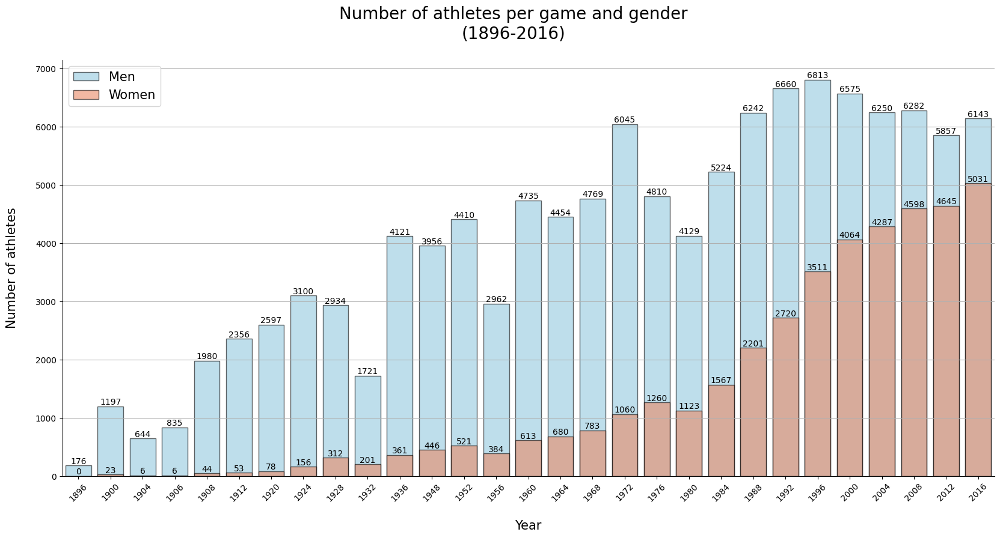

In [12]:
fig, ax = plt.subplots(figsize = (20, 9))
#Because we have different dimensions (no women competition in 1896) we create a new variable called order that will 
#help us to fix the values among the x axis from year 1896 to 2016, eventhough ther was no woman competition in 1896
order = men_data.Year.unique()
#Create the men barplot
bar_men = sns.countplot(x = 'Year',data = men_data,ax = ax,color = "skyblue",
                        alpha = .6,edgecolor = 'k',label = 'Men')

#Create the women barplot
bar_women = sns.countplot(x = 'Year',data = women_data,ax = ax,color = "coral",
                          alpha = .6,edgecolor = 'k',label = 'Women',
                          order = order)#fix the temporal series to the same timeline as men competition 

#Annotations with the number of participants per game and sex:
for i in ax.containers:
    ax.bar_label(i,)

#aesthetics:
sns.despine(right=True)
ax.set_ylabel("Number of athletes\n",fontsize=15)
ax.set_xlabel("\nYear",fontsize=15)
ax.set_xticklabels(order, size = 10 , rotation=45)
ax.set_yticklabels(ax.get_yticks().astype(int), size = 10)
plt.legend(loc='upper left',fontsize = 15)
plt.grid(axis='y')
fig.suptitle('Number of athletes per game and gender\n(1896-2016)', size = 20)

plt.show()

## 3. Number of total medals per olympic team: Plotting the fifty olympic teams with more medals in the history of modern Games 

In [13]:
#We are only interested in the athletes that actually won an olympic medal so we drop all the rows with nan values in the Medal field 
jjoo_summer_medal = jjoo_summer.dropna(subset = ['Medal'])
#Sort and subset for the top fifty:
medals_by_team = jjoo_summer_medal.groupby('Team').count().sort_values('Medal', ascending = False)
medals_subset = medals_by_team[['Medal']].iloc[0:50]

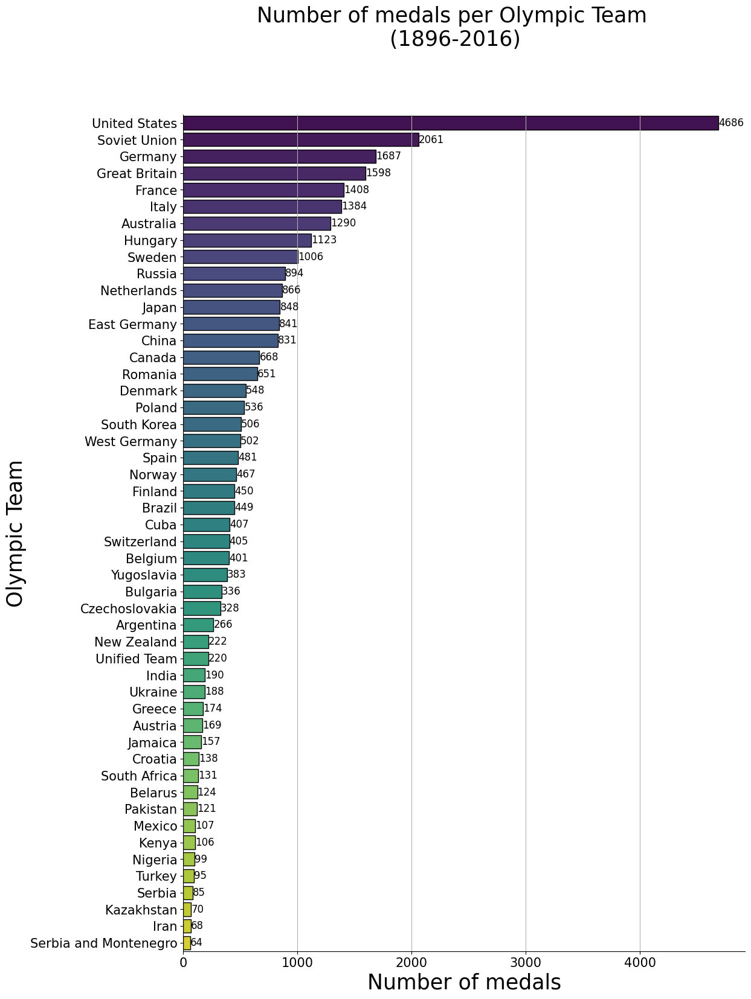

In [14]:
fig, ax = plt.subplots(figsize = (12, 18))
sns.barplot(x = 'Medal', 
            y = medals_subset.index,
            data = medals_subset,
            palette = 'viridis',
            ax = ax,
            edgecolor = 'k')

#Annotations with the number of medals per olympic team:
for i in ax.containers:
    ax.bar_label(i,size = 12)


#aesthetics:
sns.despine(right=True)
ax.set_ylabel("Olympic Team",fontsize=25)
ax.set_xlabel("Number of medals",fontsize=25)
ax.set_yticklabels(medals_subset.index, size = 15)
ax.set_xticklabels(ax.get_xticks().astype(int), size = 15)
plt.grid(axis='x')
fig.suptitle('Number of medals per Olympic Team \n(1896-2016)', size = 25)
plt.show()

## 4. Best twenty-five olimpic teams of all history with the proportion of gold, silver and bronze medal per team 

In [15]:
#Subset of the 25 best olympic teams, we can extract the info from the daframe used in point 3
df_medal = jjoo_summer_medal[jjoo_summer_medal['Team'].isin(medals_by_team.iloc[0:25].index)]

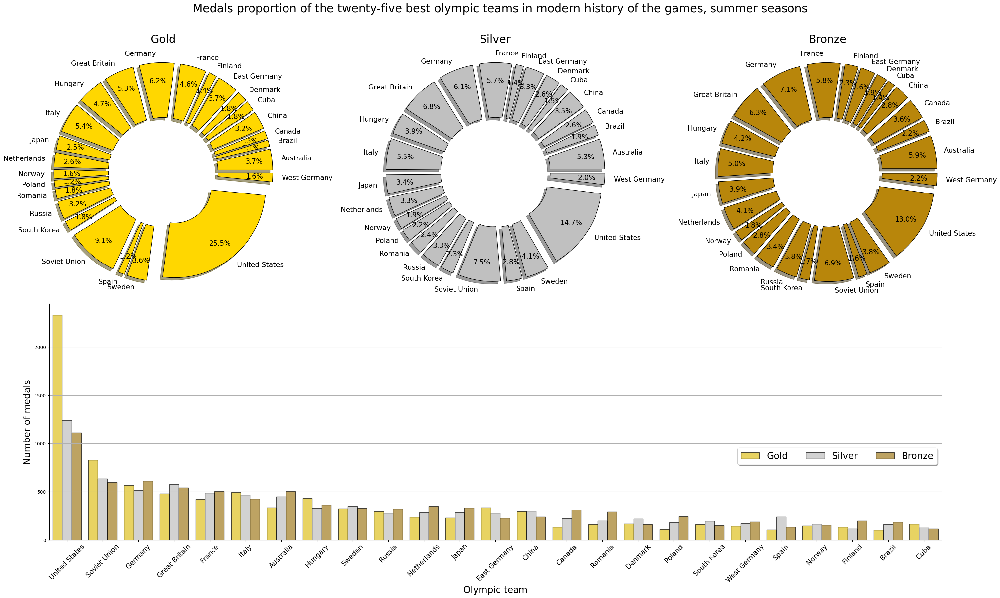

In [16]:
fig = plt.figure(constrained_layout=True, figsize = (30,18))
#create the grid where the subplots will be plotted:
gs = GridSpec(2,3, figure=fig)
#Subplot with the barchart of the top 25 best olympic teams in terms of medals
ax1 = fig.add_subplot(gs[1, :])
#Subplots with medal proportions:
ax2 = fig.add_subplot(gs[0,0])#Gold
ax3 = fig.add_subplot(gs[0,1])#Silver
ax4 = fig.add_subplot(gs[0,-1])#Bronze


#ax1 Number of medals per olympic team (1896-2016)
order = medals_by_team.iloc[0:25].index
hue_order = ['Gold', 'Silver', 'Bronze']
sns.countplot(x = 'Team',data = jjoo_summer_medal, hue = 'Medal', palette = ['gold', 'silver', 'darkgoldenrod'], hue_order = hue_order, ax = ax1,edgecolor = 'k',
            order = order, alpha = .7)
sns.despine(right=True)
#Annotations with the number of medals per olympic team:

#ax1 aesthetics:
ax1.grid(axis='y')
ax1.set_ylabel('Number of medals',fontsize=20)
ax1.set_xlabel('Olympic team',fontsize=20)
ax1.set_xticklabels(labels = order, rotation=45, size = 15)
ax1.legend(ncol = 3,  loc='lower right', shadow=True, fontsize = 20, bbox_to_anchor=(1, .3))

def medal_to_pie_chart (axis, medal_kind, plot_color, teams = 25):
    medal = df_medal[df_medal['Medal'] == medal_kind].groupby('Team').count()[['Medal']]
    number_medals = medal.Medal.tolist()
    number_teams = medal.index.tolist()
    ax_explode = tuple([.2 for i in range(teams)])
    color = [plot_color for i in range(teams)]
    ax_inner_circle, _, values = axis.pie(number_medals, explode = ax_explode, labels=number_teams, shadow=True, colors = color, autopct='%1.1f%%', pctdistance=.8,
                                         textprops={'fontsize': 15})
    axis.set_title(f'{medal_kind}\n', size = 24,  loc='center')
    plt.setp(ax_inner_circle, width=0.6, edgecolor='k')

    
#pie charts for ax2, ax3, ax4
medal_to_pie_chart (ax2, 'Gold', 'gold')
medal_to_pie_chart (ax3, 'Silver', 'silver')
medal_to_pie_chart (ax4, 'Bronze', 'darkgoldenrod')

fig.suptitle('Medals proportion of the twenty-five best olympic teams in modern history of the games, summer seasons\n', fontsize=25)

plt.show()

## 5. Evaluating age in the Olympics

In [17]:
jjoo_summer_age = jjoo_summer.dropna(subset = ['Age']).sort_values('Year')
jjoo_summer_age.head()

,Name,Sex,Age,Height,Weight,Team,NOC,Year,Season,City,Sport,Event,Medal
234445,Alajos (Aljoz) Szokoly (-Szokol),M,24.0,NaN,NaN,Hungary,HUN,1896,Summer,Athina,Athletics,Athletics Men's Triple Jump,NaN
171109,Holger Louis Nielsen,M,29.0,NaN,NaN,Denmark,DEN,1896,Summer,Athina,Shooting,"Shooting Men's Military Rifle, 200 metres",NaN
204322,Joseph Rosemeyer,M,24.0,NaN,NaN,Germany,GER,1896,Summer,Athina,Cycling,Cycling Men's 100 kilometres,NaN
198471,"Franois tienne ""Frantz"" Reichel",M,25.0,NaN,NaN,France,FRA,1896,Summer,Athina,Athletics,Athletics Men's 110 metres Hurdles,NaN
198470,"Franois tienne ""Frantz"" Reichel",M,25.0,NaN,NaN,France,FRA,1896,Summer,Athina,Athletics,Athletics Men's 400 metres,NaN


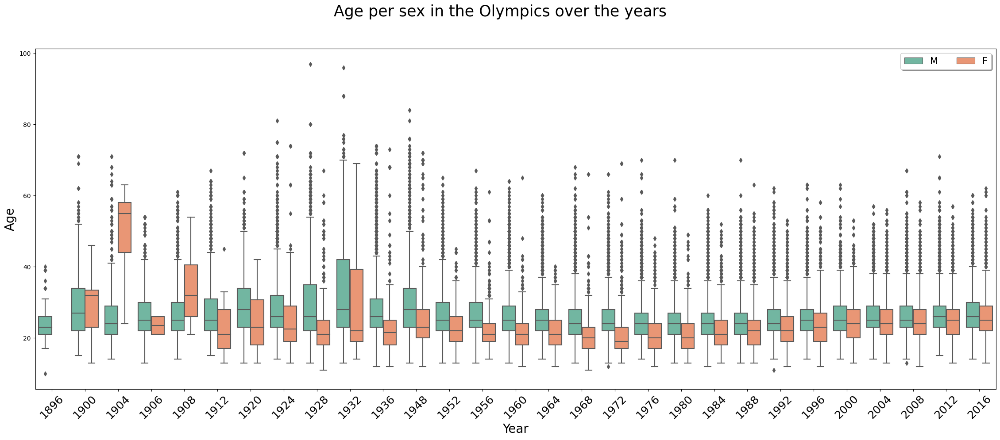

In [18]:
fig, ax = plt.subplots(figsize = (28, 10))
sns.boxplot(x = 'Year', y = 'Age', hue = 'Sex', data = jjoo_summer_age, ax =ax, palette = 'Set2')
fig.suptitle('Age per sex in the Olympics over the years', fontsize=25)
plt.legend( ncol = 2,  loc='upper right', shadow=True, fontsize = 15)
ax.set_ylabel('Age',fontsize=20)
ax.set_xlabel('Year',fontsize=20)
ax.set_xticklabels(labels = jjoo_summer_age['Year'].unique(), rotation=45, size = 18)
plt.show()

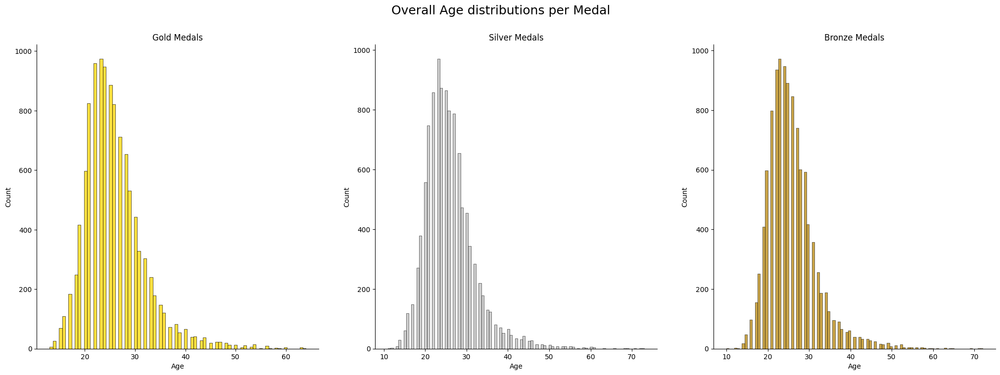

In [19]:
fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(25, 8))
sns.despine(right=True)

def hist_per_medals (axis, Medal, color):
    sns.histplot(jjoo_summer_age[jjoo_summer_age['Medal'] == Medal], x = 'Age', ax = axis, color = color)
    axis.set_title(f'\n{Medal} Medals')
    
hist_per_medals (ax1, 'Gold', 'gold')
hist_per_medals (ax2, 'Silver', 'silver')
hist_per_medals (ax3, 'Bronze', 'darkgoldenrod')

fig.suptitle('Overall Age distributions per Medal\n', size = 18)
plt.show()

The distributions observed in the plot above are quite similar and slightly skewed to the left, could be more interesting to compare (geometricaly speaking) the efect of age between the best twety-five olympic teams.


In [20]:
#Lets take the best twenty-five teams of all history and compare their distributions in search of any pattern that (without making any statistical
#analysis) could provide us with any insight of the impact of age in terms of winning a medal:
top_teams = medals_by_team.iloc[0:25].index

In [21]:
#Filter the data:
#Drop the rows without any medal and subset by team, age and sex:
medal_per_age = jjoo_summer_age[['Team', 'Sex', 'Age', 'Medal', 'Sport']].dropna(subset = ['Medal'])
medal_dict = {medal: df for medal, df in medal_per_age.groupby('Medal')}
medal_per_age = pd.concat(medal_dict).reset_index(drop = True)
medal_per_age = medal_per_age[medal_per_age['Team'].isin(top_teams)]
medal_per_age.head()

,Team,Sex,Age,Medal,Sport
1,Great Britain,M,23.0,Bronze,Athletics
2,United States,M,27.0,Bronze,Athletics
3,Denmark,M,29.0,Bronze,Shooting
4,France,M,18.0,Bronze,Cycling
9,Hungary,M,24.0,Bronze,Athletics


In [22]:
#Overall  medals:
age_Medals = {Team: np.array(df['Age']) for Team, df in medal_per_age.groupby('Team')}
#reorder dictionaries by the order of the list top_ten:
age_Medals = {k: age_Medals[k] for k in top_teams}

In [23]:
fig = ridgeplot(samples=age_Medals.values(),colorscale="viridis", colormode='index', labels = age_Medals.keys(), coloralpha =.5)
fig.update_layout(title = 'Age distribution in medalists of the top twenty-five Olympic Teams', 
                  height=850,
                  width=750,
                 yaxis_title="Olympic Tems",
                 xaxis_title="Age")
fig.show()

Although we are not using any analytical tool to confirm any hypothesis about the impact of age in winning a medal, we can observed that most of the participants in each team are between 20 and 30, if we'd like to provide a bit more of graphical information, we could plot a boxplot with a linear regression in order to contrast, for example, if there is a tendency of increasing age in this mentioned interval as we descend in the list of our top 25 Olympic Teams

In [24]:
#We create a dictionary to map the tag associated with each team into a new column in our dataframe so we can plot the regression and the boxplot in the same chart:
map_values = {Team: new_val+1 for new_val, Team in enumerate(age_Medals.keys())}
#we create a new column:
medal_per_age['Team_code'] = medal_per_age['Team'].map(map_values)

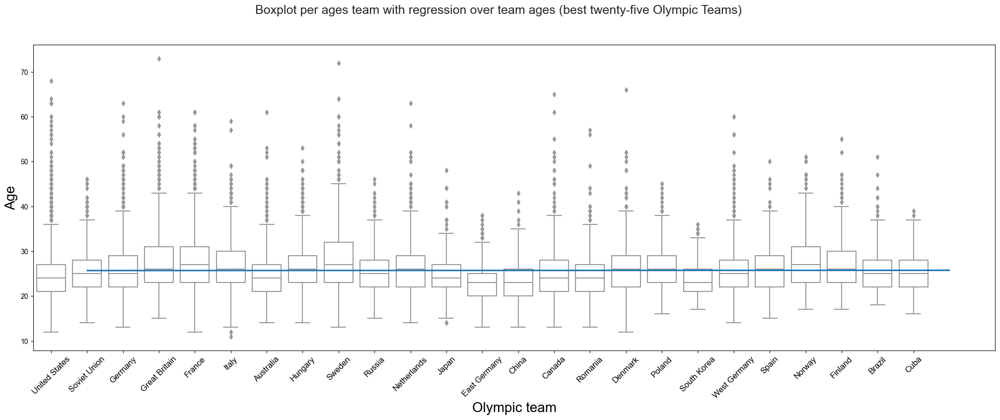

In [25]:
fig, ax = plt.subplots(figsize =(25, 8))
sns.set_style("whitegrid")
sns.boxplot(x = 'Team_code', y = 'Age', data = medal_per_age, order = map_values.values(), ax = ax, color ='w')
sns.regplot(x = 'Team_code', y = 'Age', data = medal_per_age, scatter=False, ax = ax)
ax.set_xticklabels(labels = list(map_values.keys()), rotation=45, size = 12)
ax.set_ylabel('Age',fontsize=20)
ax.set_xlabel('Olympic team',fontsize=20)
fig.suptitle('Boxplot per ages team with regression over team ages (best twenty-five Olympic Teams)', size = 18)
plt.show()

Another intereseting thing to plot would be the age distribution per sport:

In [26]:
sports = {sport: np.array(df['Age']) for sport, df in medal_per_age.groupby('Sport')}

In [27]:
fig = ridgeplot(samples=sports.values(),bandwidth = 4, colorscale="magma", colormode='index', labels = sports.keys(), coloralpha =.5)
fig.update_layout(title = 'Age distribution per sport', 
                  height=1100,
                  width=750,
                 yaxis_title="Sport",
                 xaxis_title="Age")
fig.show()

## 6. Evolution and relation between weight and hight:

In [28]:
jjoo_summer_age.head()

,Name,Sex,Age,Height,Weight,Team,NOC,Year,Season,City,Sport,Event,Medal
234445,Alajos (Aljoz) Szokoly (-Szokol),M,24.0,NaN,NaN,Hungary,HUN,1896,Summer,Athina,Athletics,Athletics Men's Triple Jump,NaN
171109,Holger Louis Nielsen,M,29.0,NaN,NaN,Denmark,DEN,1896,Summer,Athina,Shooting,"Shooting Men's Military Rifle, 200 metres",NaN
204322,Joseph Rosemeyer,M,24.0,NaN,NaN,Germany,GER,1896,Summer,Athina,Cycling,Cycling Men's 100 kilometres,NaN
198471,"Franois tienne ""Frantz"" Reichel",M,25.0,NaN,NaN,France,FRA,1896,Summer,Athina,Athletics,Athletics Men's 110 metres Hurdles,NaN
198470,"Franois tienne ""Frantz"" Reichel",M,25.0,NaN,NaN,France,FRA,1896,Summer,Athina,Athletics,Athletics Men's 400 metres,NaN


In [29]:
#Correlations between weight, height and weight:
jjoo_summer_age[['Age', 'Height', 'Weight']].corr()

,Age,Height,Weight
Age,1.000000,0.135298,0.210994
Height,0.135298,1.000000,0.795183
Weight,0.210994,0.795183,1.000000


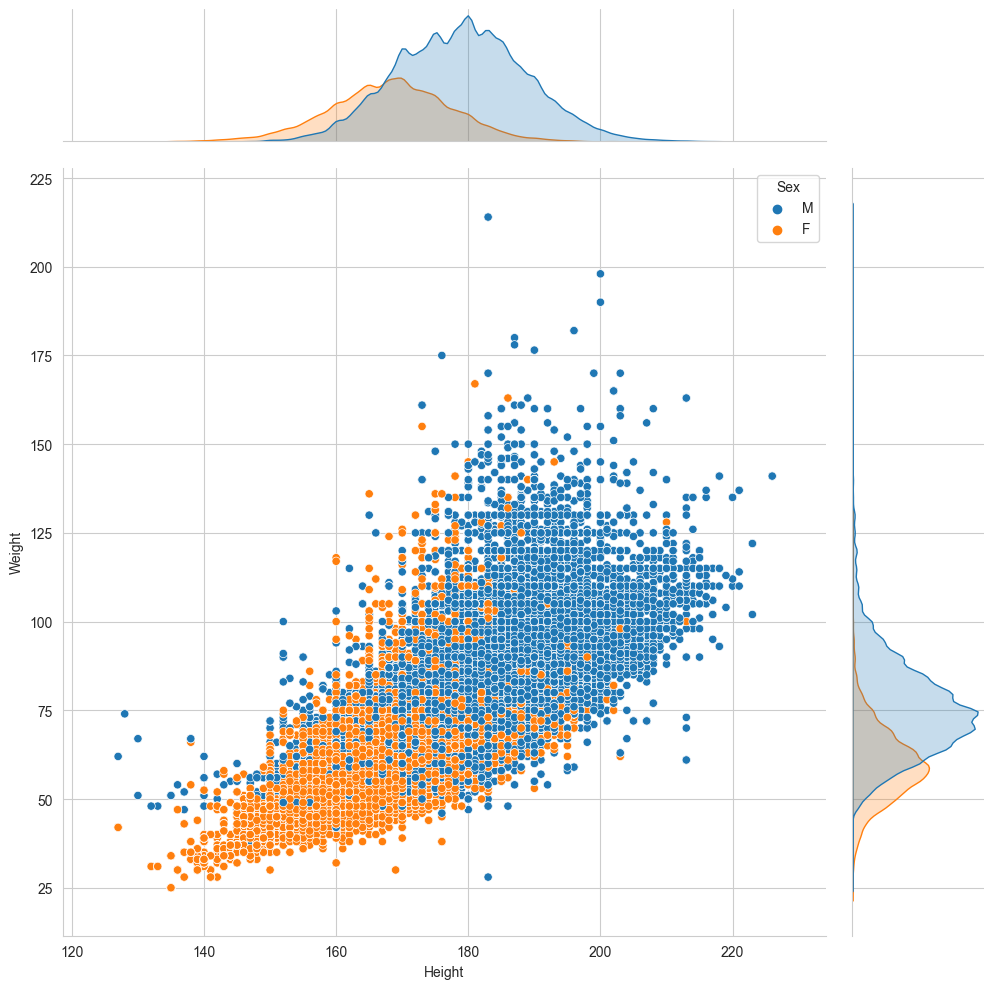

In [30]:
#Bivariate realtion between weight and height
sns.jointplot(data = jjoo_summer_age, x="Height",y="Weight", hue="Sex",height = 10, ratio = 5)
plt.show()

We can also make a temporal series considering all history (1896-2016) to describe weight and height evolution per sex:

In [31]:
#Filtering data:
df = jjoo_summer_age.sort_values('Year')
metrics_df =df.groupby(['Year', 'Sex']).agg({'Height':['mean','std'],'Weight':['mean','std']}).dropna()

In [32]:
metrics_df.head()

Height                Weight           
                mean        std       mean        std
Year Sex                                             
1896 M    172.534884  11.379490  70.956522  13.209351
1900 M    176.643478   8.423225  75.025974  11.998875
1904 M    175.776190   7.930464  72.431655  13.792484
1906 M    178.146825   7.341300  75.921569  11.983619
1908 M    177.705240   7.483199  75.697598  12.707651

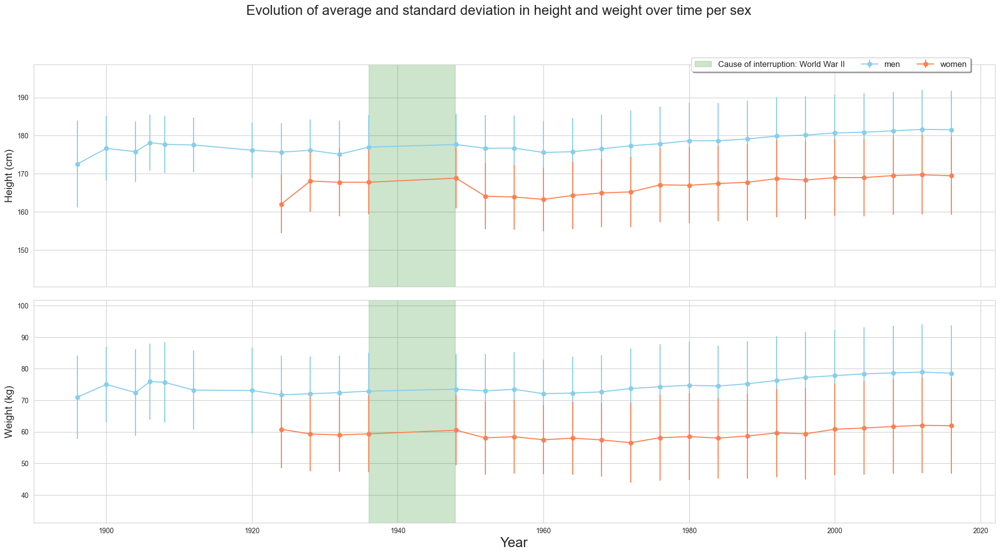

In [33]:
#Evolution of average and standard deviation in height and weight over time per sex

fig, ax = plt.subplots(2)
fig.subplots_adjust(hspace = .06)
men_df, women_df = metrics_df.xs('M', level='Sex'), metrics_df.xs('F', level='Sex')

#Men Data
M_hight_data, M_weight_data = men_df['Height']['mean'], men_df['Weight']['mean']
M_hight_yerr, M_weight_yerr = men_df['Height']['std'], men_df['Weight']['std']
M_hight_data.plot(figsize=(25,12),marker='o',grid=True,yerr = M_hight_yerr, ax = ax[0], label = 'men', color = 'skyblue')
M_weight_data.plot(figsize=(25,12), marker='o',grid=True,yerr = M_weight_yerr, ax = ax[1], label = 'men', color = 'skyblue')
x_fill = [i for i in np.arange (1936, 1948, 0.1)]
ax[0].fill_between(x_fill, 360, color = 'green',alpha=0.2, label = 'Cause of interruption: World War II')

#Women Data
W_hight_data, W_weight_data = women_df['Height']['mean'], women_df['Weight']['mean']
W_hight_yerr, W_weight_yerr = women_df['Height']['std'], women_df['Weight']['std']
W_hight_data.plot(marker='o',grid=True,yerr = M_hight_yerr, ax = ax[0], label = 'women', color = 'coral')
W_weight_data.plot(marker='o',grid=True,yerr = M_weight_yerr, ax = ax[1], label = 'women', color = 'coral')
ax[1].fill_between(x_fill, 360, color = 'green',alpha=0.2, label = 'Cause of interruption: World War II')

#axes configuration:
ax[0].set_ylim([W_hight_data.min()-2*W_hight_yerr.max(), M_hight_data.max()+1.5*M_hight_yerr.max()])
ax[0].set_ylabel('Height (cm)',fontsize=15)
ax[0].set_xticklabels([])
ax[0].set_xlabel('')
ax[1].set_ylim([W_weight_data.min()-2*W_weight_yerr.max(), M_weight_data.max()+1.5*M_weight_yerr.max()])
ax[1].set_ylabel('Weight (kg)',fontsize=15)
ax[1].set_xlabel('Year',fontsize=20)

#legend
handles, labels = ax[1].get_legend_handles_labels()
ax[0].legend(loc='upper left', bbox_to_anchor=(0.68, 1.05), ncol=3, fancybox=True, shadow=True, fontsize = 12)
fig.suptitle('Evolution of average and standard deviation in height and weight over time per sex', size = 20)
plt.show()


It can also be interesting to plot a time series for a specific sport, so we can see the evolution of the type of athlete that is considered to perform better in a certain discipline, for this matter we can built a function:

In [34]:
def H_W_per_sport (dataframe, Sport):
    df_sport = dataframe[dataframe['Sport'] == f'{Sport}'].groupby(['Year', 'Sex']).agg({'Height':['mean','std'],'Weight':['mean','std']}).dropna()
    men_data, women_data = df_sport.xs('M', level='Sex'), df_sport.xs('F', level='Sex')
    variables, data = ['Height', 'Weight'], [men_data, women_data]
    fig, ax = plt.subplots(2)
    fig.subplots_adjust(hspace = .06)
    
    for i, v in enumerate(variables):
        men_mean, men_std = men_data[v]['mean'], men_data[v]['std']
        women_mean, women_std = women_data[v]['mean'], women_data[v]['std']
        x_fill = [i for i in np.arange (1936, 1948, 0.1)]
        ax[i].fill_between(x_fill, 360, color = 'green',alpha=0.2, label = 'Cause of interruption: World War II')
        men_mean.plot(figsize=(25,12),marker='o',grid=True, yerr = men_std, ax = ax[i], label = 'men', color = 'skyblue')
        women_mean.plot(figsize=(25,12),marker='o',grid=True, yerr = women_std, ax = ax[i], label = 'women', color = 'coral')
        #axes configuration:
        ax[i].set_ylim([women_mean.min()-2*women_std.max(), men_mean.max()+1.5 * men_std.max()])
        units = 'cm' if v == 'Height' else 'kg' 
        if i == 0:
            ax[i].set_xticklabels([])
            ax[i].set_xlabel('')
        else:
            ax[i].set_xlabel('Year',fontsize=20)
            
        ax[i].set_ylabel(f'{v} ({units})',fontsize=15)
        handles, labels = ax[i].get_legend_handles_labels()
        
    ax[0].legend(loc='upper left', bbox_to_anchor=(0.68, 1.05), ncol=3, fancybox=True, shadow=True, fontsize = 12)
    fig.suptitle(f'Evolution of average and standard deviation in height and weight over time per sex in {Sport.lower()}', size = 20)
    plt.show()

Plotting some examples:

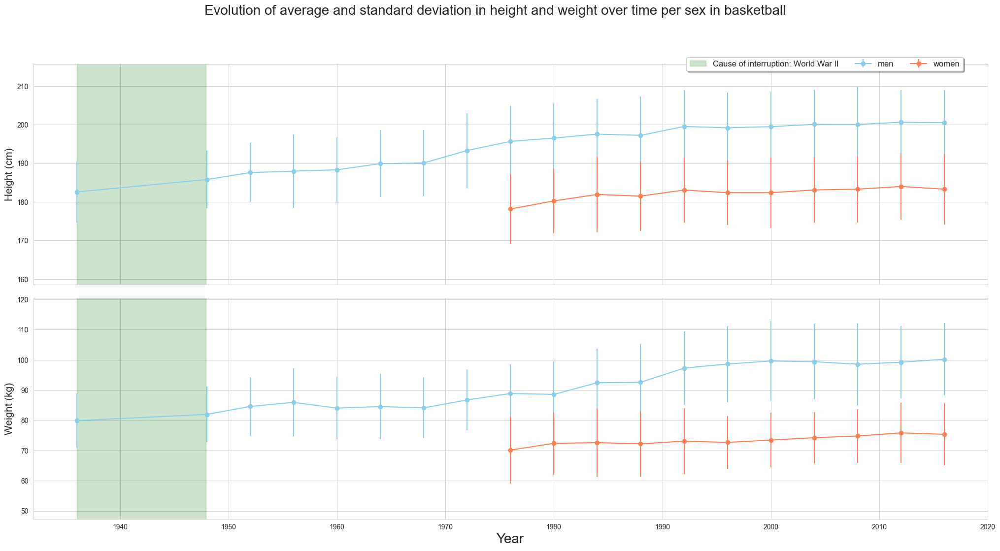

In [35]:
 H_W_per_sport (jjoo_summer_age, 'Basketball')

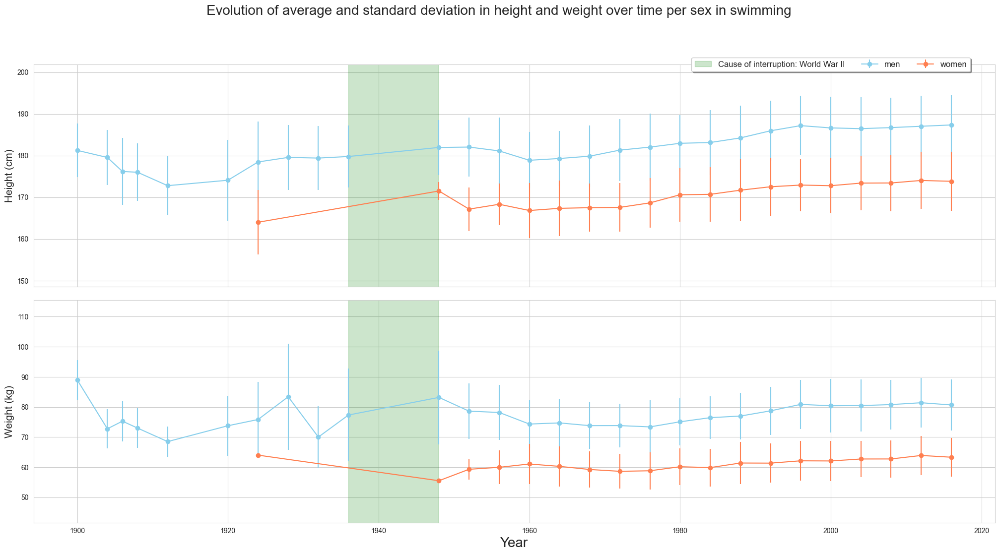

In [36]:
 H_W_per_sport (jjoo_summer_age, 'Swimming')

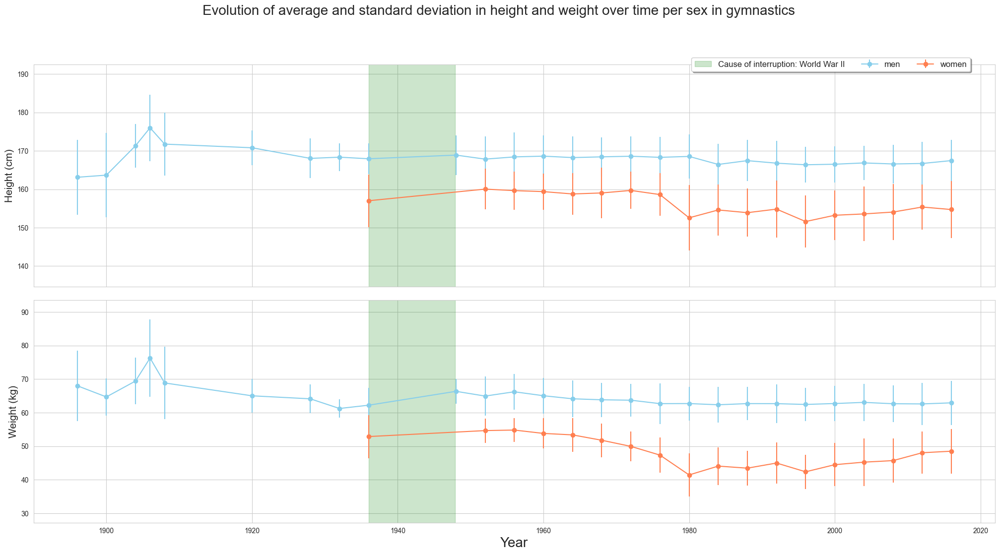

In [37]:
 H_W_per_sport (jjoo_summer_age, 'Gymnastics')